<a href="https://colab.research.google.com/github/BellaNico4/Siren-ML/blob/main/SIREN_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Init useful functions

In [ ]:
import torch
from torch import nn
import numpy as np
from torch.utils.data import Dataset,DataLoader
import torch.nn.functional as F
import os
import json
from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize,CenterCrop
import numpy as np
import skimage
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from torchsummary import summary
import sklearn
from sklearn.metrics import mean_squared_error
import time
import cv2
import pandas as pd
import gc
import scipy.ndimage
try:
    os.mkdir('train')
except OSError as error:
    print(error)   
try:
  os.mkdir('validation')
except OSError as error:
    print(error)
!nvidia-smi


torch.cuda.empty_cache()

[Errno 17] File exists: 'train'
[Errno 17] File exists: 'validation'
Tue May 18 16:02:12 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P0    86W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                   

In [ ]:
## Function to create datasets

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

def get_cameraman_tensor(sidelength):
  '''Get the "camera" image dataset
    sidelen: int'''
  img = Image.fromarray(skimage.data.camera())        
  transform = Compose([
    Resize(sidelength),
    ToTensor(),
    Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
  img = transform(img)
  return img

def get_astronaut_tensor(sidelength):
  '''Get the "Astronaut" image dataset
    sidelen: int'''
  img = rgb2gray(skimage.data.astronaut())
  img = Image.fromarray(img)     
  transform = Compose([
    Resize(sidelength),
    ToTensor(),
    Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
  img = transform(img)
  return img

def get_image_tensor(sidelength,image):
  transform = Compose([
    Resize(sidelength),
    CenterCrop(sidelength),
    ToTensor(),
    Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
  img = transform(image)
  return img
def get_RGB_image_tensor(sidelength,image):
  transform = Compose([
    Resize(sidelength),
    
    ToTensor(),
    Normalize(torch.Tensor((0.5, 0.5, 0.5)), torch.Tensor((0.5, 0.5, 0.5)))
    ])
  img = transform(image)
  img = img +1
  img = img - img.min()
  img = img / (img.max() - img.min())
  return img

class ImageFitting(Dataset):
  '''Create Cameraman as a dataset'''
  def __init__(self, sidelength,transform=None):
    super().__init__()
    img = get_cameraman_tensor(sidelength)
    #fig, axes = plt.subplots(1,1, figsize=(18,6))
    #axes.imshow(img.view(sidelength,sidelength).detach().numpy(),camp='gray')
    #fig.show()
    self.pixels = img.permute(1,2,0).view(-1, 1)
    self.coords = get_mgrid(sidelength, 2)

  def __len__(self):
    return 1

  def __getitem__(self, idx):    
    if idx > 0: raise IndexError
        
    return self.coords, self.pixels

class ImageAstronaut(Dataset):
    '''Create Astronaut as a dataset'''
    def __init__(self, sidelength,transform=None):
        super().__init__()
        img = get_astronaut_tensor(sidelength)
        fig, axes = plt.subplots(1,1, figsize=(18,6))
        axes.imshow(img.view(sidelength,sidelength).detach().numpy(),cmap='gray')
        fig.show()
        self.pixels = img.permute(1,2,0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels


# To do: choose an image from HDD and train return it as dataset
class ImageFile(Dataset):
  '''Get the local image used for training
    '''
  def __init__(self,filename,sidelength):
      super().__init__()
      img = Image.open(filename)
      #self.img_channels = len(self.img.mode)
      img = rgb2gray(np.asarray(img))
      img = Image.fromarray(img)
      img = get_image_tensor(sidelength,img)
      self.pixels = img.permute(1,2,0).view(-1, 1)
      self.coords = get_mgrid(sidelength, 2)
  def __len__(self):
        return 1

  def __getitem__(self, idx):
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

class ImageFile_RGB(Dataset):
  '''Get the local RGB image used for training
    '''
  def __init__(self,filename,sidelength):
      super().__init__()
      img = Image.open(filename)
      #self.img_channels = len(self.img.mode)
      #img = rgb2gray(np.asarray(img))
      #img = Image.fromarray(img)
      img = get_RGB_image_tensor(sidelength,img)
      self.pixels = img.permute(1,2,0).view(-1, 3)
      self.coords = get_mgrid(sidelength, 2)
  def __len__(self):
        return 1

  def __getitem__(self, idx):
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

class Div2K_images(Dataset):
  '''Get the DIV2K images for training. Remember to put the images in the /train and in /validation'''
  def __init__(self,sidelength,set_name='train'):
      super().__init__()
      self.set_name = set_name
      if set_name == 'train':
        self.filenames = [x for x in os.listdir('./train') if '.jpg' in x]
      else:
        self.filenames = [x for x in os.listdir('./validation') if '.jpg' in x]
      self.length = len(self.filenames)
      self.sidelen = sidelength
  def __len__(self):
        return self.length

  def __getitem__(self, idx):
        if idx > self.length: raise IndexError
        path = './'+self.set_name+'/'+self.filenames[idx]
        img = Image.open(path)
        img = rgb2gray(np.asarray(img))
        img = Image.fromarray(img)
        img = get_image_tensor(self.sidelen,img)
        pixels = img.permute(1,2,0).view(-1, 1)
        coords = get_mgrid(self.sidelen, 2)
        return coords, pixels

In [ ]:
## Function to compute derivatives

def laplace(y, x):
  '''Compute the 2° derivatives of y wrt x'''
  grad = gradient(y, x)
  return divergence(grad, x)


def divergence(y, x):
  div = 0.
  for i in range(y.shape[-1]):
      div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
  return div


def gradient(y, x, grad_outputs=None):
  '''Compute the gradients of y wrt x'''
  if grad_outputs is None:
      grad_outputs = torch.ones_like(y)
  grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
  return grad



In [ ]:
class SineLayer(nn.Module):
  '''Single Layer of the SIREN: here we have a neuron with a Sin activation function'''
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)


    #c_uniform: define the initial weights distribution
    #ablation_studies: chnage the inizialization scheme

    
  def __init__(self, in_features, out_features, bias=True,
                is_first=False, omega_0=30,ablation_studies=False,c_uniform=6):
    super().__init__()
    self.omega_0 = omega_0
    self.is_first = is_first
    
    self.in_features = in_features
    self.linear = nn.Linear(in_features, out_features, bias=bias)
    
    self.init_weights(ablation_studies,c_uniform)
  
  def init_weights(self,ablation_studies=False,c_uniform=6):
      with torch.no_grad():
          if self.is_first:
            if ablation_studies:
              self.linear.weight.uniform_(-np.pi,np.pi)
              #self.linear.weight.uniform_(60,100)
            else:
              self.linear.weight.uniform_(-1 / self.in_features, 
                                            1 / self.in_features)      
          else:
            if ablation_studies:
              self.linear.weight.uniform_(-np.pi/self.omega_0,np.pi/self.omega_0)
              #self.linear.weight.uniform_(-100,100)
            else:
              self.linear.weight.uniform_(-np.sqrt(c_uniform / self.in_features) / self.omega_0, 
                                            np.sqrt(c_uniform / self.in_features) / self.omega_0)
      
  def forward(self, input):
      return torch.sin(self.omega_0 * self.linear(input))
  
  def forward_with_intermediate(self, input): 
      # For visualization of activation distributions
      intermediate = self.omega_0 * self.linear(input)
      return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    '''SIREN net'''
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.,ablation_studies=False,c_uniform=6):
        super().__init__()
        
        self.net = []
        
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0,
                                  ablation_studies=ablation_studies,
                                  c_uniform=c_uniform))

        for i in range(hidden_layers):
          self.net.append(SineLayer(hidden_features, hidden_features, 
                                  is_first=False, omega_0=hidden_omega_0,
                                  ablation_studies=ablation_studies,
                                  c_uniform=c_uniform,
                                  ))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(c_uniform / hidden_features) / hidden_omega_0, 
                                              np.sqrt(c_uniform / hidden_features) / hidden_omega_0)
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0,ablation_studies=ablation_studies,
                                      c_uniform=c_uniform,
                                      ))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations


## RELU net to comaparison
class LinearLayer(nn.Module):
  '''Single Layer of the Net: here we have a neuron with a ReLU activation function'''   
  def __init__(self, in_features, out_features, bias=True):
    super().__init__()    
    self.in_features = in_features
    self.linear = nn.Linear(in_features, out_features, bias=bias)
    self.out_features = out_features
    self.init_weights()
  
  def init_weights(self):
      with torch.no_grad():
              w = self.linear.weight
              nn.init.xavier_normal_(w, gain=nn.init.calculate_gain('relu'))
      
  def forward(self, input):
      return torch.relu(self.linear(input))
  
  def forward_with_intermediate(self, input): 
      # For visualization of activation distributions
      intermediate = self.linear(input)
      return torch.relu(intermediate), intermediate
    
    
class FCNet(nn.Module):
    '''Fully connected net'''
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, hidden_omega_0=30.,c_uniform=6):
        super().__init__()
        
        self.net = []
        self.net.append(LinearLayer(in_features, hidden_features))

        for i in range(hidden_layers):
            self.net.append(LinearLayer(hidden_features, hidden_features))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(c_uniform / hidden_features) / hidden_omega_0, 
                                              np.sqrt(c_uniform / hidden_features) / hidden_omega_0)
            self.net.append(final_linear)
        else:
            self.net.append(LinearLayer(hidden_features, out_features))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [ ]:
## Loss Function
def image_mse_TV_prior(mask, k1, model, model_output,coords, gt):
    coords_rand = 2 * (torch.rand((coords.shape[0],
                                   coords.shape[1] // 2,
                                   coords.shape[2])).cuda() - 0.5)
    rand_output, rand_coords = model(coords_rand)
    if mask is None:
        return {'img_loss': ((model_output - gt) ** 2).mean(),
                'prior_loss': k1 * (torch.abs(gradient(
                    rand_output, rand_coords))).mean()}
    else:
        return {'img_loss': (mask * (model_output - gt) ** 2).mean(),
                'prior_loss': k1 * (torch.abs(gradient(
                    rand_output, rand_coords))).mean()}

def hessian(y, x):
    ''' hessian of y wrt x
    y: shape (meta_batch_size, num_observations, channels)
    x: shape (meta_batch_size, num_observations, 2)
    '''
    meta_batch_size, num_observations = y.shape[:2]
    grad_y = torch.ones_like(y[..., 0]).to(y.device)
    h = torch.zeros(meta_batch_size, num_observations, y.shape[-1], x.shape[-1], x.shape[-1]).to(y.device)
    for i in range(y.shape[-1]):
        # calculate dydx over batches for each feature value of y
        dydx = torch.autograd.grad(y[..., i], x, grad_y, create_graph=True)[0]

        # calculate hessian on y for each x value
        for j in range(x.shape[-1]):
            h[..., i, j, :] = torch.autograd.grad(dydx[..., j], x, grad_y, create_graph=True)[0][..., :]

    status = 0
    if torch.any(torch.isnan(h)):
        status = -1
    return h, status


def image_mse_FH_prior(mask, k1, model, model_output,coords, gt):
  coords_rand = 2 * (torch.rand((coords.shape[0],
                              coords.shape[1] // 2,
                              coords.shape[2])).cuda() - 0.5)
  rand_output, rand_coords = model(coords_rand)

  img_hessian, status = hessian(rand_output,rand_coords)
  img_hessian = img_hessian.view(*img_hessian.shape[0:2], -1)
  hessian_norm = img_hessian.norm(dim=-1, keepdim=True)

  if mask is None:
      return {'img_loss': ((model_output - gt) ** 2).mean(),
              'prior_loss': k1 * (torch.abs(hessian_norm)).mean()}
  else:
      return {'img_loss': (mask * (model_output - gt) ** 2).mean(),
              'prior_loss': k1 * (torch.abs(hessian_norm)).mean()}

def image_mse(mask, k1, model, model_output,coords, gt):
    if mask is None:
        return {'img_loss': ((model_output - gt) ** 2).mean()}
    else:
        return {'img_loss': (mask * (model_output - gt) ** 2).mean()}


def super_res_loss_TV_prior(mask, k1, model, model_output,coords, gt,up_sampling=2,image_size=256):
    coords_rand = 2 * (torch.rand((coords.shape[0],
                                   coords.shape[1] // 2,
                                   coords.shape[2])).cuda() - 0.5)
    rand_output, rand_coords = model(coords_rand)
    model_output_image =  model_output.view(1,1,image_size*up_sampling,image_size*up_sampling)
    resampled_tensor = torch.nn.functional.interpolate(model_output_image, scale_factor=1/up_sampling, mode='bicubic')
    resampled_tensor = resampled_tensor.view(-1,1)
    if mask is None:
        return {'img_loss': ((resampled_tensor - gt[0]) ** 2).mean(),
                'prior_loss': k1 * (torch.abs(gradient(
                    rand_output, rand_coords))).mean()}
    else:
        return {'img_loss': (mask * (model_output - gt) ** 2).mean(),
                'prior_loss': k1 * (torch.abs(gradient(
                    rand_output, rand_coords))).mean()}

def super_res_loss_FH_prior(mask, k1, model, model_output,coords, gt,up_sampling=2,image_size=256):
    coords_rand = 2 * (torch.rand((coords.shape[0],
                                   coords.shape[1] // 2,
                                   coords.shape[2])).cuda() - 0.5)
    rand_output, rand_coords = model(coords_rand)
    model_output_image =  model_output.view(1,1,image_size*up_sampling,image_size*up_sampling)
    resampled_tensor = torch.nn.functional.interpolate(model_output_image, scale_factor=1/up_sampling, mode='bicubic')
    resampled_tensor = resampled_tensor.view(-1,1)

    img_hessian, status = hessian(rand_output,rand_coords)
    img_hessian = img_hessian.view(*img_hessian.shape[0:2], -1)
    hessian_norm = img_hessian.norm(dim=-1, keepdim=True)

    if mask is None:
        return {'img_loss': ((resampled_tensor - gt[0]) ** 2).mean(),
                'prior_loss':  k1 * (torch.abs(hessian_norm)).mean()}
    else:
        return {'img_loss': (mask * (model_output - gt) ** 2).mean(),
                'prior_loss':  k1 * (torch.abs(hessian_norm)).mean()}

def super_res_loss_image_mse(mask, k1, model, model_output,coords, gt,up_sampling=2,image_size=256):
    model_output_image =  model_output.view(1,1,image_size*up_sampling,image_size*up_sampling)
    resampled_tensor = torch.nn.functional.interpolate(model_output_image, scale_factor=1/up_sampling, mode='bicubic')
    resampled_tensor = resampled_tensor.view(-1,1)
    if mask is None:
        return {'img_loss': ((resampled_tensor - gt[0]) ** 2).mean()}
    else:
        return {'img_loss': (mask * (model_output - gt) ** 2).mean()}


def gradients_mse(model_output, coords, gt_gradients):
    # compute gradients on the model
    gradients = gradient(model_output, coords)
    # compare them with the ground-truth
    gradients_loss = torch.mean((gradients - gt_gradients).pow(2).sum(-1))
    return gradients_loss

In [ ]:
## Train and validatation

def psnr_fn(model_output,gt):
  losses = image_mse(None,None,None,model_output,None,gt)
  if not isinstance(losses['img_loss'],(np.float32,np.ndarray)):
    mse = losses['img_loss'].cpu().detach().numpy()
  else:
    mse = losses['img_loss']
  if not isinstance(gt,(np.float32,np.ndarray)):
    I = gt.cpu().detach().numpy().max()
  else:
    I = gt.max()
  
  psnr = 20*np.log10(I/np.sqrt(mse))
  return psnr

def train_siren(X,y,learning_rate=1e-4,max_iteration=200,hidden_ft=256,hidden_ly=3,
                lambda_reg=1e-6,param_0 = None,show_plot=False,steps_til_summary=50,loss_fn=image_mse,image_size=256):
  img_siren = Siren(in_features=2, hidden_features=hidden_ft, 
                  hidden_layers=hidden_ly, out_features=1, outermost_linear=True)
  if param_0 != None:
    img_siren.load_state_dict(param_0)
  optim = torch.optim.Adam(lr=learning_rate, params=img_siren.parameters())
  img_siren.cuda()
  for step in range(max_iteration):
      model_output, coords = img_siren(X)
      losses = loss_fn(None,lambda_reg,img_siren,model_output,X,y)
      train_loss = 0
      for loss_name, loss_tmp in losses.items():
        train_loss += loss_tmp.mean() 
      loss = train_loss
      if not step % steps_til_summary:
        if show_plot:
          print("Step %d, Total loss %0.6f" % (step, loss))
          psnr = psnr_fn(model_output,y)
          print('PSNR original image: ' + str(psnr) + ' lambda:' + str(lambda_reg))
          img_grad = gradient(model_output, coords)
          img_laplacian = laplace(model_output, coords)
          fig, axes = plt.subplots(1,3, figsize=(18,6))
          axes[0].imshow(model_output.cpu().view(image_size,image_size).detach().numpy(),cmap='gray')
          axes[1].imshow(img_grad.norm(dim=-1).cpu().view(image_size,image_size).detach().numpy())
          axes[2].imshow(img_laplacian.cpu().view(image_size,image_size).detach().numpy(),cmap='gray')
          plt.show()
      optim.zero_grad()
      loss.backward()
      optim.step()
  return img_siren

def train_siren_with_psnr(X,y,learning_rate=1e-4,max_iteration=200,hidden_ft=256,hidden_ly=3,
                lambda_reg=1e-6,param_0 = None,show_plot=False,steps_til_summary=50,loss_fn=image_mse,image_size=256):
  img_siren = Siren(in_features=2, hidden_features=hidden_ft, 
                  hidden_layers=hidden_ly, out_features=1, outermost_linear=True)
  if param_0 != None:
    img_siren.load_state_dict(param_0)
  optim = torch.optim.Adam(lr=learning_rate, params=img_siren.parameters())
  img_siren.cuda()
  psnr_list = []
  for step in range(max_iteration):
      model_output, coords = img_siren(X)
      psnr = psnr_fn(model_output,y)
      psnr_list.append(psnr)
      losses = loss_fn(None,lambda_reg,img_siren,model_output,X,y)
      train_loss = 0
      for loss_name, loss_tmp in losses.items():
        train_loss += loss_tmp.mean() 
      loss = train_loss
      if not step % steps_til_summary:
        if show_plot:
          print("Step %d, Total loss %0.6f" % (step, loss))
          print('PSNR original image: ' + str(psnr) + ' lambda:' + str(lambda_reg))
          img_grad = gradient(model_output, coords)
          img_laplacian = laplace(model_output, coords)
          fig, axes = plt.subplots(1,3, figsize=(18,6))
          axes[0].imshow(model_output.cpu().view(image_size,image_size).detach().numpy(),cmap='gray')
          axes[1].imshow(img_grad.norm(dim=-1).cpu().view(image_size,image_size).detach().numpy())
          axes[2].imshow(img_laplacian.cpu().view(image_size,image_size).detach().numpy(),cmap='gray')
          plt.show()
      optim.zero_grad()
      loss.backward()
      optim.step()
  return img_siren,psnr_list

def meta_learning_siren(max_outer_steps,max_inner_step,outer_lr,
                        inner_lr,hidden_ft=256,hidden_ly=3,lambda_reg=1e-6,
                        show_plot=False,steps_til_summary=50,inner_loss_fn=image_mse,
                        outer_loss_fn=image_mse,image_size=256,batch_size = 1):
  i = 0
  div2k = Div2K_images(image_size)
  dataloader = DataLoader(div2k, batch_size=batch_size, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  weight_dict = None
  outern_siren = Siren(in_features=2,hidden_features=hidden_ft,hidden_layers=hidden_ly,out_features=1,outermost_linear=True)
  outern_siren.cuda()
  outern_opt = torch.optim.Adam(lr=outer_lr, params=outern_siren.parameters())
  states =  []
  for model_input, ground_truth in dataset:
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    states =  []
    for k in range(batch_size):
      img_siren = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                              hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                              lambda_reg=lambda_reg,param_0 = weight_dict,
                              X=model_input[k],y=ground_truth[k],
                              show_plot=show_plot,steps_til_summary=steps_til_summary,
                              loss_fn=inner_loss_fn,image_size=image_size)
      
      #weight_dict = img_siren.state_dict()
      #print('finished batch ' + str(k))
      states.append(img_siren.state_dict())
    new_weights = states[0]
    for key,t_param in new_weights.items():
        for k in range(1,batch_size):
          #print('updating weights ' + str(k))
          new_weights[key] = new_weights[key] + states[k][key]
        new_weights[key] = new_weights[key]/batch_size
    #print('Load dict on outern siren')  
    outern_siren.load_state_dict(new_weights)
    model_output, coords = outern_siren(model_input)
    losses = outer_loss_fn(None,lambda_reg,outern_siren,model_output,coords,ground_truth)
    train_loss = 0
    for loss_name, loss_tmp in losses.items():
      train_loss += loss_tmp.mean() 
    outern_loss = train_loss    
    outern_opt.zero_grad()
    outern_loss.backward()
    outern_opt.step()
    #print('Update outern weights')  
    weight_dict = outern_siren.state_dict()
    i+=1
    print('Iteration %d / %d' % (i, max_outer_steps))
    if i == max_outer_steps:
      break
  return outern_siren.state_dict()


def meta_learning_siren_batch_1(max_outer_steps,max_inner_step,outer_lr,
                        inner_lr,hidden_ft=256,hidden_ly=3,lambda_reg=1e-6,
                        show_plot=False,steps_til_summary=50,inner_loss_fn=image_mse,
                        outer_loss_fn=image_mse,image_size=256):
  i = 0
  div2k = Div2K_images(image_size)
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  weight_dict = None
  outern_siren = Siren(in_features=2,hidden_features=hidden_ft,hidden_layers=hidden_ly,out_features=1,outermost_linear=True)
  outern_siren.cuda()
  outern_opt = torch.optim.Adam(lr=outer_lr, params=outern_siren.parameters())
  for model_input, ground_truth in dataset:
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    img_siren = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = weight_dict,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn,image_size=image_size)
      
    weight_dict = img_siren.state_dict()
    i+=1
    print('Iteration %d / %d' % (i, max_outer_steps))
    if i == max_outer_steps:
      break
  return weight_dict

def meta_learning_siren_REPTILE(max_outer_steps,max_inner_step,outer_lr,inner_lr,
                                hidden_ft=256,hidden_ly=3,lambda_reg=1e-6,
                                show_plot=False,steps_til_summary=50,inner_loss_fn=image_mse,
                                outer_loss_fn=image_mse,
                                image_size=256):
  i = 0
  div2k = Div2K_images(image_size)
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  old_parameters = None
  outern_siren = Siren(in_features=2,hidden_features=hidden_ft,hidden_layers=hidden_ly,out_features=1,outermost_linear=True)
  outern_siren.cuda()
  old_parameters = outern_siren.state_dict()
  for model_input, ground_truth in dataset:
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    img_siren = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = old_parameters,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn,image_size=image_size)
    weight_dict = img_siren.state_dict()
    new_weights = {}
    for key,t_param in weight_dict.items():
      new_weights[key] = old_parameters[key] - outer_lr* (weight_dict[key] - old_parameters[key])
    old_parameters = weight_dict
    outern_siren.load_state_dict(new_weights)
    weight_dict = outern_siren.state_dict()
    i+=1
    print('Iteration %d / %d' % (i, max_outer_steps))
    if i == max_outer_steps:
      break
  torch.cuda.empty_cache()
  del img_siren
  return new_weights

def validate_model(param0,max_inner_step,inner_lr,hidden_ft=256,hidden_ly=3,lambda_reg=1e-6,show_plot=False,steps_til_summary=50,inner_loss_fn=image_mse,image_size=256):
  div2k = Div2K_images(image_size,'validation')
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  i = 0
  psnr_df_meta = pd.DataFrame(columns=[str(x) for x in range(5)])
  psnr_df_no_meta = pd.DataFrame(columns=[str(x) for x in range(5)])
  for model_input, ground_truth in dataset:
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    img_siren_ml,psnr_list_ml = train_siren_with_psnr(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = param0,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    psnr_df_meta[str(i)] = psnr_list_ml



    img_siren,psnr_list_no_ml = train_siren_with_psnr(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = None,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    psnr_df_no_meta[str(i)] = psnr_list_no_ml
    i=i+1
    model_output_ml, coords = img_siren_ml(model_input)
    model_output, coords = img_siren(model_input)
    output_image_ml = model_output_ml.cpu().view(image_size,image_size).detach().numpy()
    output_image = model_output.cpu().view(image_size,image_size).detach().numpy()
    ground_truth_image = ground_truth.cpu().view(image_size,image_size).detach().numpy()
    psnr = psnr_fn(model_output,ground_truth)
    psnr_ml = psnr_fn(model_output_ml,ground_truth)
    print('PSNR Siren no ML: ' + str(psnr))
    print('PSNR Siren with ML: ' + str(psnr_ml))
    fig, axes = plt.subplots(1,3, figsize=(18,6))
    axes[0].imshow(output_image_ml,cmap='gray')
    axes[0].set_title('SIREN image with Meta Learning')
    axes[1].imshow(output_image,cmap='gray')
    axes[1].set_title('SIREN image NO meta learning')
    axes[2].imshow(ground_truth_image,cmap='gray')
    axes[2].set_title('Ground Truth Image Low Res')
    plt.show()

  psnr_list_ml=psnr_df_meta.mean(axis=1)
  psnr_list_no_ml = psnr_df_no_meta.mean(axis=1)
  return psnr_list_ml,psnr_list_no_ml

def validate_single_model(param0,max_inner_step,inner_lr,hidden_ft=256,hidden_ly=3,lambda_reg=1e-6,show_plot=False,steps_til_summary=50,inner_loss_fn=image_mse,image_size=256):
  div2k = Div2K_images(image_size,'validation')
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  i = 0
  psnr_df = pd.DataFrame(columns=[str(x) for x in range(5)])
  for model_input, ground_truth in dataset:
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    img_siren_ml,psnr_list_ml = train_siren_with_psnr(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = param0,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    psnr_df[str(i)] = psnr_list_ml
    i=i+1
  psnr_list_ml=psnr_df.mean(axis=1)
  return psnr_list_ml

def super_res_validation(param0,max_inner_step,inner_lr,hidden_ft=256,hidden_ly=3,
                         lambda_reg=1e-6,show_plot=False,steps_til_summary=50,
                         inner_loss_fn=image_mse,image_size=256,magnification = 2):
  div2k = Div2K_images(image_size,'validation')
  aug_size = image_size*magnification
  div2k_HR = Div2K_images(aug_size,'validation')
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  dataloader_HR = DataLoader(div2k_HR, batch_size=1, pin_memory=False, num_workers=0)
  dataset_HR = iter(dataloader_HR)
  for (model_input, ground_truth), (model_input_HR,ground_truth_HR) in zip(dataset,dataset_HR):
    print()
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    model_input_HR, ground_truth_HR = model_input_HR.cuda(), ground_truth_HR.cuda()
    img_siren_ml = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = param0,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    
    img_siren = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = None,
                            X=model_input,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    
    model_output_ml, coords = img_siren_ml(model_input_HR)
    model_output, coords = img_siren(model_input_HR)
    output_image_ml = model_output_ml.cpu().view(aug_size,aug_size).detach().numpy()
    output_image = model_output.cpu().view(aug_size,aug_size).detach().numpy()
    ground_truth_image_HR = ground_truth_HR.cpu().view(aug_size,aug_size).detach().numpy()
    ground_truth_image_LR = ground_truth.cpu().view(image_size,image_size).detach().numpy()

    bicubic_img = cv2.resize(ground_truth_image_LR,(aug_size,aug_size), interpolation = cv2.INTER_CUBIC)

    psnr = psnr_fn(model_output,ground_truth_HR)
    psnr_ml = psnr_fn(model_output_ml,ground_truth_HR)
    psnr_bic = psnr_fn(bicubic_img,ground_truth_image_HR)
    print('PSNR Siren no ML on HI-RES image: ' + str(psnr))
    print('PSNR Siren with ML on HI-RES image: ' + str(psnr_ml))
    print('PSNR Bicubic HI-RES image: ' + str(psnr_bic))

    fig, axes = plt.subplots(1,3, figsize=(18,10))
    axes[0].imshow(ground_truth_image_LR,cmap='gray')
    axes[0].set_title('Ground Truth Image LO-RES')
    axes[1].imshow(output_image,cmap='gray')
    axes[1].set_title('SIREN NO Meta learning HI-RES image')
    axes[2].imshow(bicubic_img,cmap='gray')
    axes[2].set_title('Bicubic Interpolation HI-RES image')
    plt.show()
    fig, axes = plt.subplots(1,2, figsize=(18,10))
    axes[0].imshow(ground_truth_image_HR,cmap='gray')
    axes[0].set_title('Ground Truth Image HI-RES')
    axes[1].imshow(output_image_ml,cmap='gray')
    axes[1].set_title('SIREN Meta Learning HI-RES image')
    plt.show()

def super_res_validation_bicubic(param0,max_inner_step,inner_lr,hidden_ft=256,hidden_ly=3,
                         lambda_reg=1e-6,show_plot=False,steps_til_summary=50,
                         inner_loss_fn=image_mse,image_size=256,magnification = 2):
  div2k = Div2K_images(image_size,'validation')
  aug_size = image_size*magnification
  div2k_HR = Div2K_images(aug_size,'validation')
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  dataloader_HR = DataLoader(div2k_HR, batch_size=1, pin_memory=False, num_workers=0)
  dataset_HR = iter(dataloader_HR)
  psnr_list = []
  for (model_input, ground_truth), (model_input_HR,ground_truth_HR) in zip(dataset,dataset_HR):
    print()
    ground_truth_image_HR = ground_truth_HR.view(aug_size,aug_size).detach.numpy()
    ground_truth_image_LR = ground_truth.view(image_size,image_size).detach().numpy()
    bicubic_img = cv2.resize(ground_truth_image_LR,(aug_size,aug_size), interpolation = cv2.INTER_CUBIC)
    psnr_bic = psnr_fn(bicubic_img,ground_truth_image_HR)
    psnr_list.append(psnr_bic)
  return np.mean(psnr_list)
  
def super_res_single_validation(param0,max_inner_step,inner_lr,hidden_ft=256,hidden_ly=3,
                         lambda_reg=1e-6,show_plot=False,steps_til_summary=50,
                         inner_loss_fn=image_mse,image_size=256,magnification = 2):
  div2k = Div2K_images(image_size,'validation')
  aug_size = image_size*magnification
  div2k_HR = Div2K_images(aug_size,'validation')
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  dataloader_HR = DataLoader(div2k_HR, batch_size=1, pin_memory=False, num_workers=0)
  dataset_HR = iter(dataloader_HR)
  psnr_list = []
  super_res_losses = [super_res_loss_FH_prior,super_res_loss_image_mse,super_res_loss_TV_prior]
  for (model_input, ground_truth), (model_input_HR,ground_truth_HR) in zip(dataset,dataset_HR):
    print()
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    model_input_HR, ground_truth_HR = model_input_HR.cuda(), ground_truth_HR.cuda()
    if inner_loss_fn in super_res_losses:
      img_siren_ml = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                              hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                              lambda_reg=lambda_reg,param_0 = param0,
                              X=model_input_HR,y=ground_truth,
                              show_plot=show_plot,steps_til_summary=steps_til_summary,
                              loss_fn=inner_loss_fn)
    else:
      img_siren_ml = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                              hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                              lambda_reg=lambda_reg,param_0 = param0,
                              X=model_input,y=ground_truth,
                              show_plot=show_plot,steps_til_summary=steps_til_summary,
                              loss_fn=inner_loss_fn)
    model_output_ml, coords = img_siren_ml(model_input_HR)
    psnr_ml = psnr_fn(model_output_ml,ground_truth_HR)
    psnr_list.append(psnr_ml)
  return np.mean(psnr_list)



def super_res_validation_bicubic_mse(param0,max_inner_step,inner_lr,hidden_ft=256,hidden_ly=3,
                         lambda_reg=1e-6,show_plot=False,steps_til_summary=50,
                         inner_loss_fn=super_res_loss_TV_prior,image_size=256,magnification = 2):
  div2k = Div2K_images(image_size,'validation')
  aug_size = image_size*magnification
  div2k_HR = Div2K_images(aug_size,'validation')
  dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
  dataset = iter(dataloader)
  dataloader_HR = DataLoader(div2k_HR, batch_size=1, pin_memory=False, num_workers=0)
  dataset_HR = iter(dataloader_HR)
  for (model_input, ground_truth), (model_input_HR,ground_truth_HR) in zip(dataset,dataset_HR):
    print()
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    model_input_HR, ground_truth_HR = model_input_HR.cuda(), ground_truth_HR.cuda()
    img_siren_ml = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = param0,
                            X=model_input_HR,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    
    img_siren = train_siren(learning_rate=inner_lr,max_iteration=max_inner_step,
                            hidden_ft=hidden_ft,hidden_ly=hidden_ly,
                            lambda_reg=lambda_reg,param_0 = None,
                            X=model_input_HR,y=ground_truth,
                            show_plot=show_plot,steps_til_summary=steps_til_summary,
                            loss_fn=inner_loss_fn)
    
    model_output_ml, coords = img_siren_ml(model_input_HR)
    model_output, coords = img_siren(model_input_HR)
    output_image_ml = model_output_ml.cpu().view(aug_size,aug_size).detach().numpy()
    output_image = model_output.cpu().view(aug_size,aug_size).detach().numpy()
    ground_truth_image_HR = ground_truth_HR.cpu().view(aug_size,aug_size).detach().numpy()
    ground_truth_image_LR = ground_truth.cpu().view(image_size,image_size).detach().numpy()

    bicubic_img = cv2.resize(ground_truth_image_LR,(aug_size,aug_size), interpolation = cv2.INTER_CUBIC)

    psnr = psnr_fn(model_output,ground_truth_HR)
    psnr_ml = psnr_fn(model_output_ml,ground_truth_HR)
    psnr_bic = psnr_fn(bicubic_img,ground_truth_image_HR)
    print('PSNR Siren no ML on HI-RES image: ' + str(psnr))
    print('PSNR Siren with ML on HI-RES image: ' + str(psnr_ml))
    print('PSNR Bicubic HI-RES image: ' + str(psnr_bic))

    fig, axes = plt.subplots(1,3, figsize=(18,10))
    axes[0].imshow(ground_truth_image_LR,cmap='gray')
    axes[0].set_title('Ground Truth Image LO-RES')
    axes[1].imshow(output_image,cmap='gray')
    axes[1].set_title('SIREN NO Meta learning HI-RES image')
    axes[2].imshow(bicubic_img,cmap='gray')
    axes[2].set_title('Bicubic Interpolation HI-RES image')
    plt.show()
    fig, axes = plt.subplots(1,2, figsize=(18,10))
    axes[0].imshow(ground_truth_image_HR,cmap='gray')
    axes[0].set_title('Ground Truth Image HI-RES')
    axes[1].imshow(output_image_ml,cmap='gray')
    axes[1].set_title('SIREN Meta Learning HI-RES image')
    plt.show()

In [ ]:
## Poisson Equation Functions
class PoissonEqn(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        
        # Compute gradient and laplacian       
        grads_x = scipy.ndimage.sobel(img.numpy(), axis=1).squeeze(0)[..., None]
        grads_y = scipy.ndimage.sobel(img.numpy(), axis=2).squeeze(0)[..., None]
        grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)
                
        self.grads = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)
        self.laplace = scipy.ndimage.laplace(img.numpy()).squeeze(0)[..., None]
        self.laplace = torch.from_numpy(self.laplace)
        
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        return self.coords, {'pixels':self.pixels, 'grads':self.grads, 'laplace':self.laplace}

class PoissonEqn_Astronaut(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_astronaut_tensor(sidelength)

        # Compute gradient and laplacian       
        grads_x = scipy.ndimage.sobel(img.numpy(), axis=1).squeeze(0)[..., None]
        grads_y = scipy.ndimage.sobel(img.numpy(), axis=2).squeeze(0)[..., None]
        grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)
                
        self.grads = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)
        self.laplace = scipy.ndimage.laplace(img.numpy()).squeeze(0)[..., None]
        self.laplace = torch.from_numpy(self.laplace)
        
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        return self.coords, {'pixels':self.pixels, 'grads':self.grads, 'laplace':self.laplace}

class PoissonEqn_fromFile(Dataset):
    def __init__(self, filename,sidelength):
        super().__init__()
        img = Image.open(filename)
        img = rgb2gray(np.asarray(img))
        img = Image.fromarray(img)
        img = get_image_tensor(sidelength,img)
        
        # Compute gradient and laplacian       
        grads_x = scipy.ndimage.sobel(img.numpy(), axis=1).squeeze(0)[..., None]
        grads_y = scipy.ndimage.sobel(img.numpy(), axis=2).squeeze(0)[..., None]
        grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)
                
        self.grads = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)
        self.laplace = scipy.ndimage.laplace(img.numpy()).squeeze(0)[..., None]
        self.laplace = torch.from_numpy(self.laplace)
        
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        return self.coords, {'pixels':self.pixels, 'grads':self.grads, 'laplace':self.laplace}

class Div2K_Poisson_Equation(Dataset):
  '''Get the local image used for training
    '''
  def __init__(self,sidelength,set_name='train'):
      super().__init__()
      self.set_name = set_name
      if set_name == 'train':
        self.filenames = [x for x in os.listdir('./train') if '.jpg' in x]
      else:
        self.filenames = [x for x in os.listdir('./validation') if '.jpg' in x]
      self.length = len(self.filenames)
      self.sidelen = sidelength
  def __len__(self):
        return self.length

  def __getitem__(self, idx):
        if idx > self.length: raise IndexError
        path = './'+self.set_name+'/'+self.filenames[idx]

        img = Image.open(path)
        img = rgb2gray(np.asarray(img))
        img = Image.fromarray(img)
        img = get_image_tensor(self.sidelen,img)
        
        # Compute gradient and laplacian       
        grads_x = scipy.ndimage.sobel(img.numpy(), axis=1).squeeze(0)[..., None]
        grads_y = scipy.ndimage.sobel(img.numpy(), axis=2).squeeze(0)[..., None]
        grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)

        gt = {}        
        gt['grads'] = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)
        gt['laplace'] = scipy.ndimage.laplace(img.numpy()).squeeze(0)[..., None]
        gt['laplace'] = torch.from_numpy(gt['laplace'])
        
        gt['pixels'] = img.permute(1, 2, 0).view(-1, 1)
        coords = get_mgrid(self.sidelen, 2)

        return coords, gt

# Experiments

### ReLU baseline

In [ ]:
IMAGE_SIZE = 256
div2k = Div2K_images(IMAGE_SIZE)
dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)

img_relu = FCNet(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
img_relu.cuda()

##Garbage collector: to avoid saturate CUDA memory...
gc.collect()
no_pt = 0
print('Network Parameters report:')
for parameter in img_relu.parameters():
  print(parameter.shape)
summary(img_relu, (1, 65536, 2))
total_steps = 10001

steps_til_summary = set([0,1000,10000])

optim = torch.optim.Adam(lr=1e-3, params=img_relu.parameters())

model_input, ground_truth = next(iter(dataloader))
fig, axes = plt.subplots(1,1, figsize=(18,6))
axes.imshow(ground_truth.view(256,256).detach().numpy(),cmap='gray')
axes.set_title('Target')
plt.show()
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
psnr_relu_list = []
for step in range(total_steps):
    model_output, coords = img_relu(model_input)
    loss = ((model_output - ground_truth)**2).mean()
    psnr = psnr_fn(model_output,ground_truth)
    psnr_relu_list.append(psnr)
    if step in steps_til_summary:
        print("Step %d, Total loss %0.6f, PSNR %0.6f" % (step, loss,psnr))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)
        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(),cmap='gray')
        plt.show()
    optim.zero_grad()
    loss.backward()
    optim.step()
fig, ax = plt.subplots()
t = range(1,total_steps+1)
ax.plot(t, psnr_relu_list)
ax.set(xlabel='Steps', ylabel='PSNR',
       title='PSNR evolution during the training (ReLU)')
ax.grid()
#fig.savefig("psnr_relu_image_fitting.png")
plt.show()

### Image Fitting

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:132: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  img = torch.from_numpy(np.array(pic, np.float32, copy=False))


Step 0, Total loss 0.399936
PSNR original image: 2.4252651631832123 lambda:0


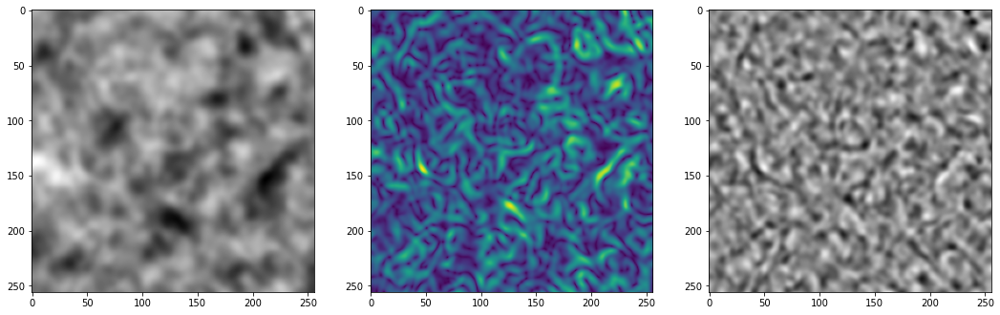

Step 200, Total loss 0.004580
PSNR original image: 21.836130619049072 lambda:0


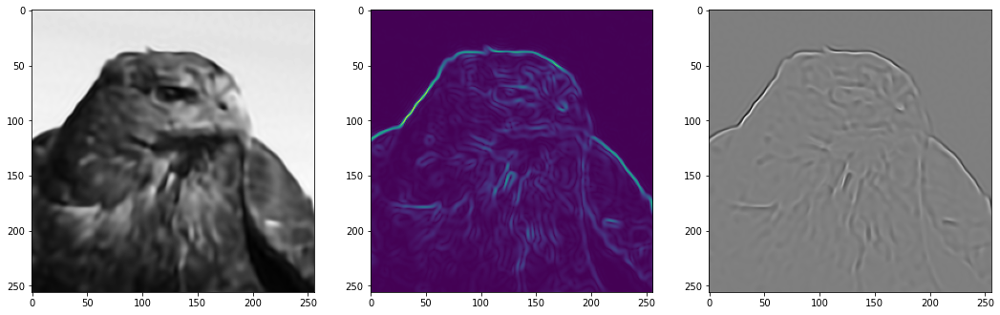

Step 400, Total loss 0.002285
PSNR original image: 24.855835437774658 lambda:0


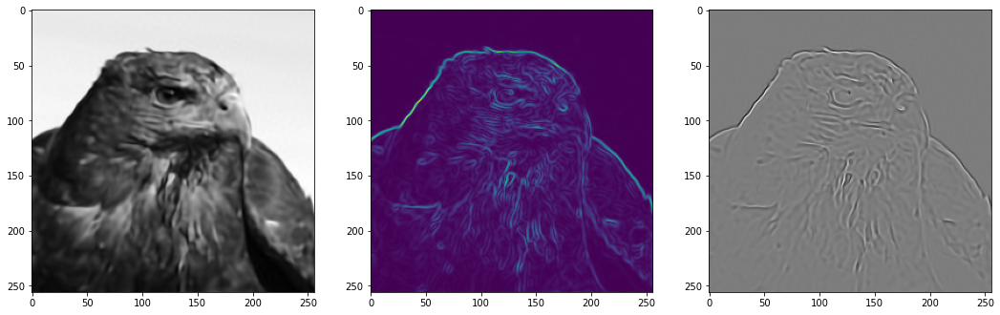

Step 600, Total loss 0.001286
PSNR original image: 27.353942394256592 lambda:0


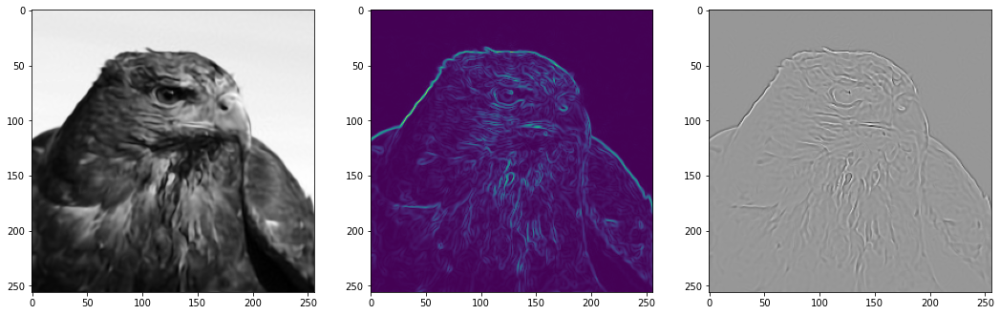

Step 800, Total loss 0.000700
PSNR original image: 29.99192714691162 lambda:0


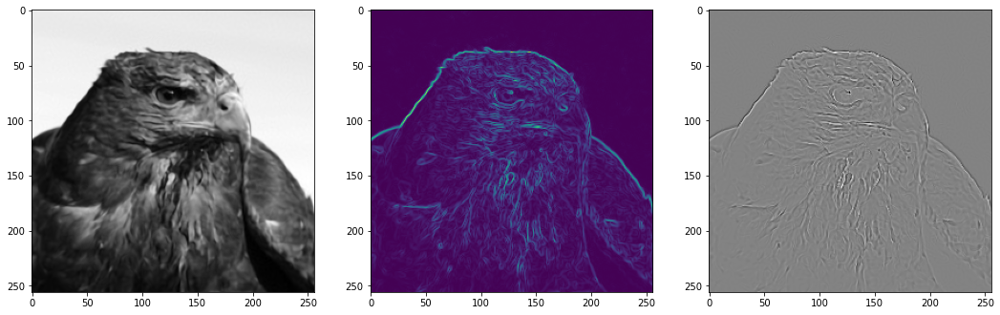

Step 1000, Total loss 0.000388
PSNR original image: 32.5531005859375 lambda:0


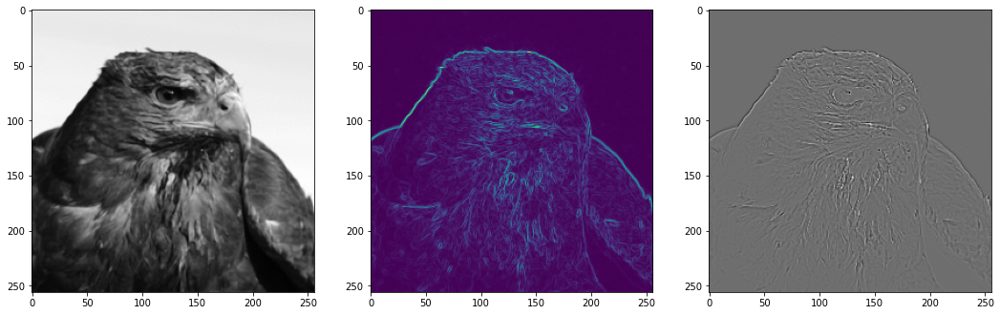

torch.Size([256, 2])
torch.Size([256])
torch.Size([256, 256])
torch.Size([256])
torch.Size([256, 256])
torch.Size([256])
torch.Size([256, 256])
torch.Size([256])
torch.Size([1, 256])
torch.Size([1])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1        [-1, 1, 65536, 256]             768
         SineLayer-2        [-1, 1, 65536, 256]               0
            Linear-3        [-1, 1, 65536, 256]          65,792
         SineLayer-4        [-1, 1, 65536, 256]               0
            Linear-5        [-1, 1, 65536, 256]          65,792
         SineLayer-6        [-1, 1, 65536, 256]               0
            Linear-7        [-1, 1, 65536, 256]          65,792
         SineLayer-8        [-1, 1, 65536, 256]               0
            Linear-9          [-1, 1, 65536, 1]             257
Total params: 198,401
Trainable params: 198,401
Non-trainable params: 0
------------------------

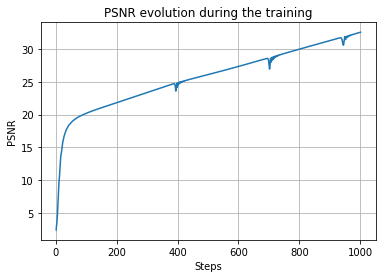

In [ ]:
IMAGE_SIZE = 256
LEARNING_RATE = 1e-4
MAX_ITER = 1001
HIDDEN_LAYERS = 3
HIDDEN_FEATURES = 256

div2k = Div2K_images(IMAGE_SIZE)
dataloader = DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0)
model_input, ground_truth = next(iter(dataloader))
fig, axes = plt.subplots(1,1, figsize=(18,6))
axes.imshow(ground_truth.view(256,256).detach().numpy(),cmap='gray')
axes.set_title('Target')
plt.show()
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
gc.collect()
img_siren,psnr_list = train_siren_with_psnr(model_input,ground_truth,learning_rate=1e-4,
                        max_iteration=MAX_ITER,hidden_ft=HIDDEN_FEATURES,
                        hidden_ly=HIDDEN_LAYERS,lambda_reg=0,
                        show_plot=True,
                        steps_til_summary=200,
                        loss_fn=image_mse,
                        image_size=IMAGE_SIZE)
for parameter in img_siren.parameters():
  print(parameter.shape)
summary(img_siren, (1, IMAGE_SIZE**2, 2))

fig, ax = plt.subplots()
t = range(1,MAX_ITER+1)
ax.plot(t, psnr_list)
ax.set(xlabel='Steps', ylabel='PSNR',
       title='PSNR evolution during the training')
ax.grid()
#fig.savefig("psnr_image_fitting.png")
plt.show()

In [ ]:
torch.cuda.empty_cache()
!nvidia-smi

Tue May 18 16:05:10 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P0    71W / 149W |    438MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### DIfferent loss with prior

Iteration 1


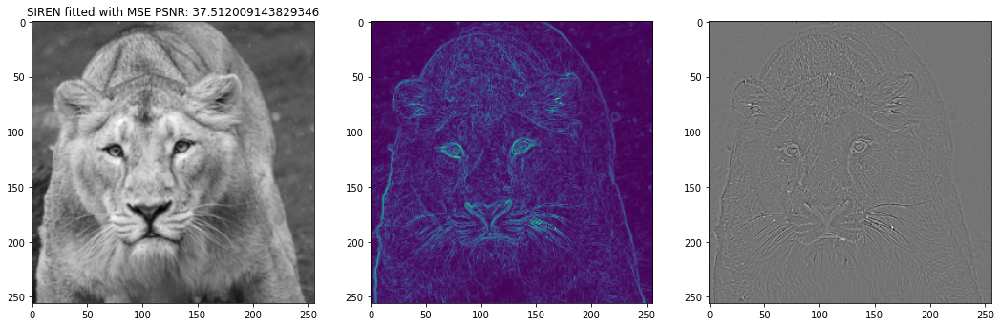

Iteration 2


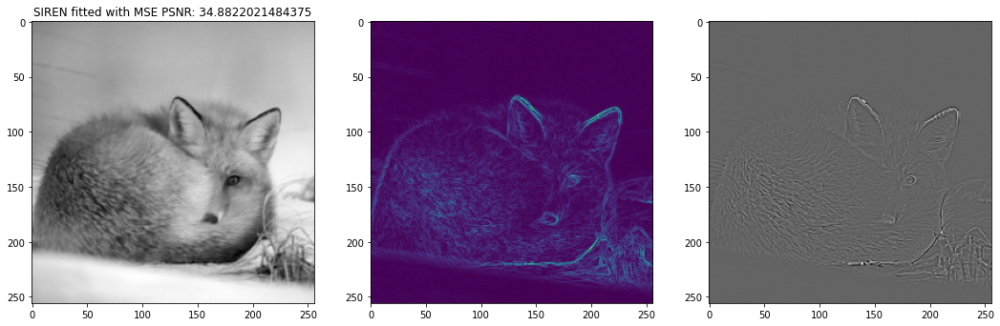

Iteration 3


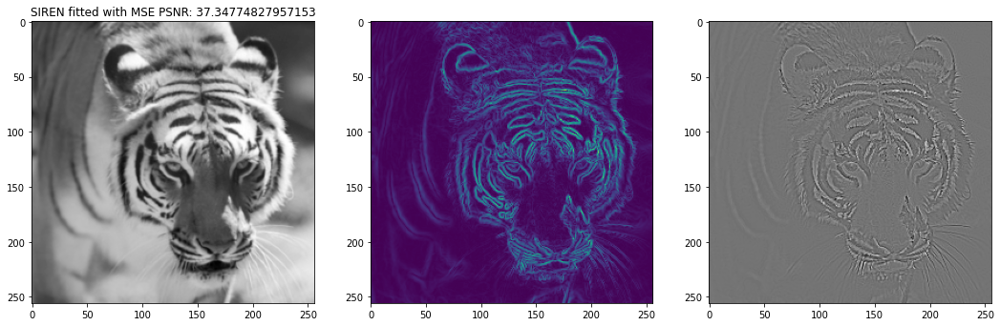

Iteration 4


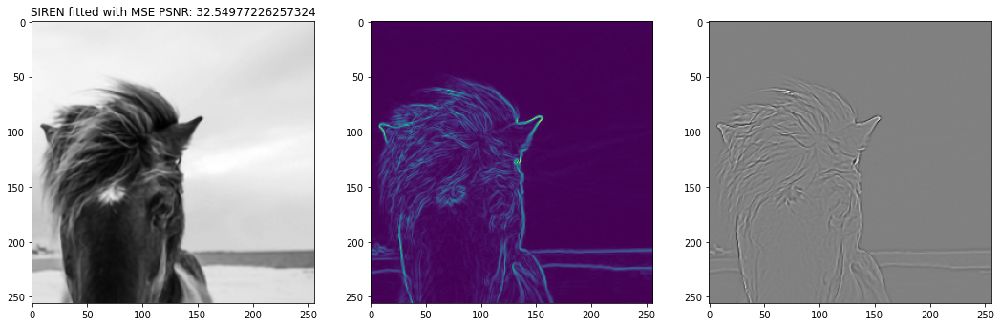

Iteration 5


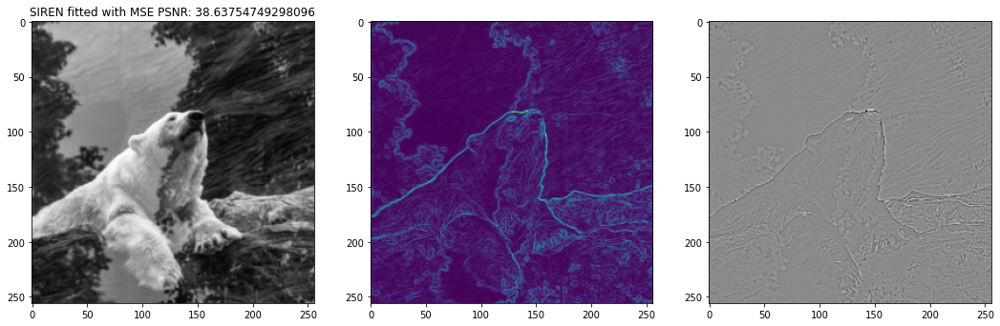

Iteration 1


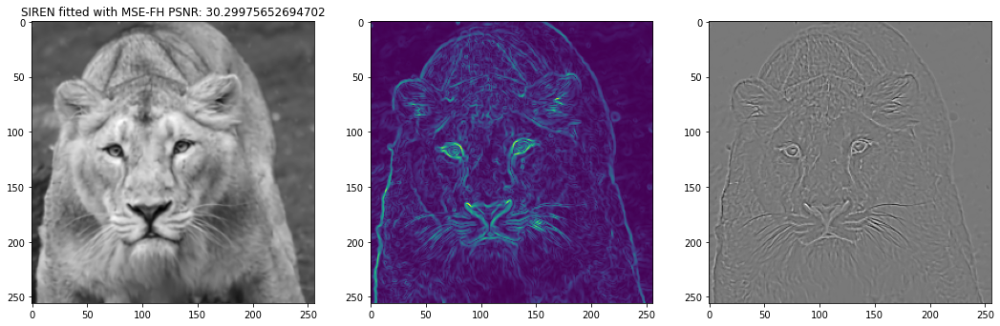

Iteration 2


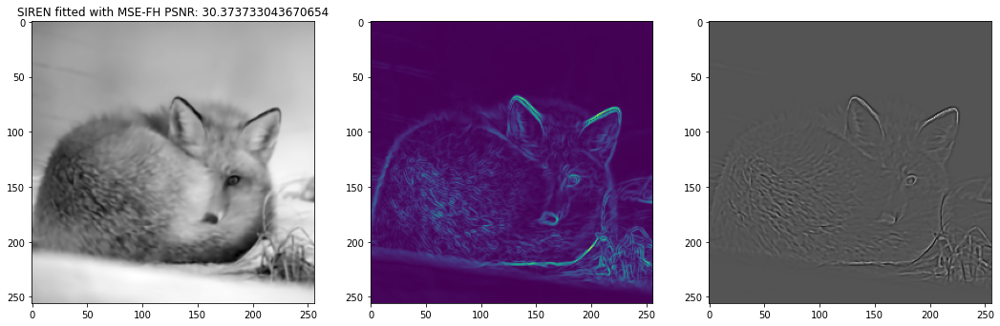

Iteration 3


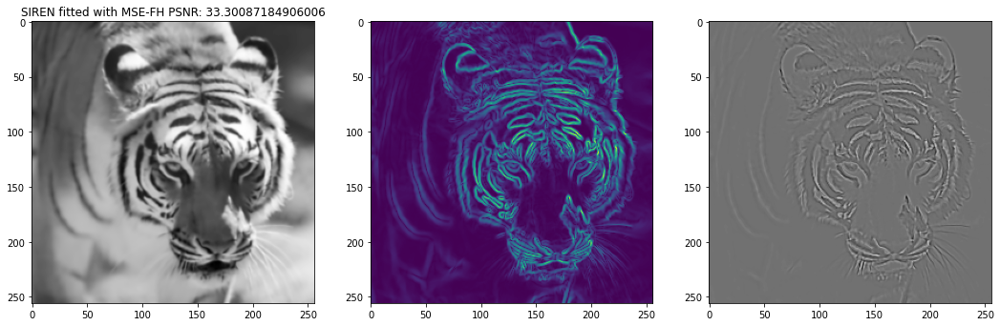

Iteration 4


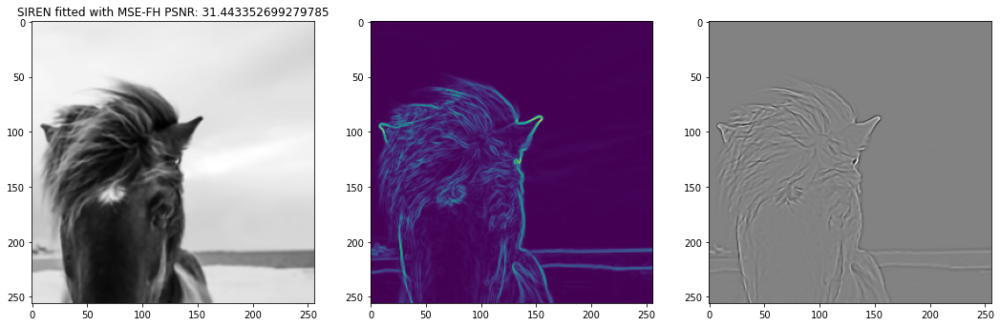

Iteration 5


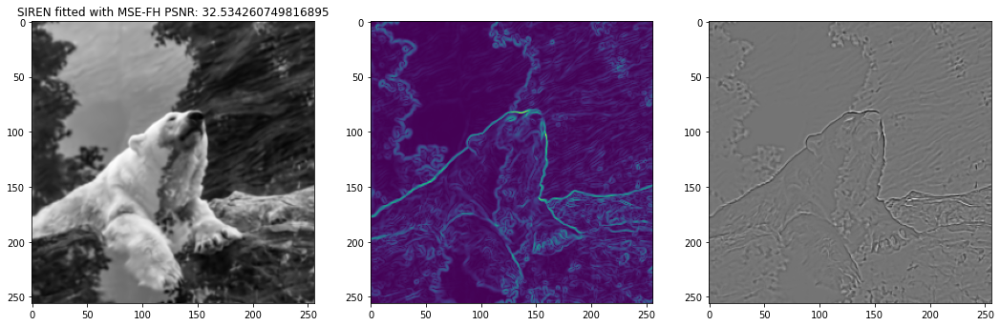

Iteration 1


In [ ]:
IMAGE_SIZE = 256
LEARNING_RATE = 1e-4
MAX_ITER = 1000
HIDDEN_LAYERS = 3
HIDDEN_FEATURES = 256

loss_fn_list = {'MSE':image_mse,
                'MSE-FH': image_mse_FH_prior,
                'MSE-TV':image_mse_TV_prior
                }
psnr_dict = {}
psnr_df = pd.DataFrame(columns=[str(x) for x in range(5)])
for key,ls in loss_fn_list.items():
  div2k = Div2K_images(IMAGE_SIZE,'validation')
  dataloader = iter(DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0))
  if (key == 'MSE-FH'):
      lambda_reg = 1e-6
  else:
      lambda_reg = 1e-4
  for i in range(5):
    print('Iteration %d'%(i+1))
    model_input, ground_truth = next(dataloader)
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    img_siren,psnr_list = train_siren_with_psnr(model_input,ground_truth,learning_rate=LEARNING_RATE,max_iteration=MAX_ITER,loss_fn=ls,lambda_reg=lambda_reg)
    model_output,coords = img_siren(model_input)
    psnr_df[str(i)] = psnr_list
    img_grad = gradient(model_output, coords)
    img_laplacian = laplace(model_output, coords)
    fig, axes = plt.subplots(1,3, figsize=(18,6))
    axes[0].imshow(model_output.cpu().view(IMAGE_SIZE,IMAGE_SIZE).detach().numpy(),cmap='gray')
    axes[0].set_title('SIREN fitted with ' + key + ' PSNR: ' + str(psnr_list[-1]))
    axes[1].imshow(img_grad.norm(dim=-1).cpu().view(IMAGE_SIZE,IMAGE_SIZE).detach().numpy())
    axes[2].imshow(img_laplacian.cpu().view(IMAGE_SIZE,IMAGE_SIZE).detach().numpy(),cmap='gray')
    plt.show()
  psnr_dict[key]=psnr_df.mean(axis=1)

t = range(1,MAX_ITER+1)
plt.figure(1)
fig, ax = plt.subplots()
ax.set(xlabel='Steps', ylabel='PSNR',
        title='PSNR evolution during the training')
for key,ls in loss_fn_list.items():
  plt.figure(1)
  ax.plot(t, psnr_dict[key],label=key)
  ax.legend()
  ax.grid()
name = 'psnr_image_fitting_different_prior.png'
#fig.savefig(name)

### Poisson Equation

Step 0, Total loss 8.803398, iteration time 0.115227, PSNR: 2.488166


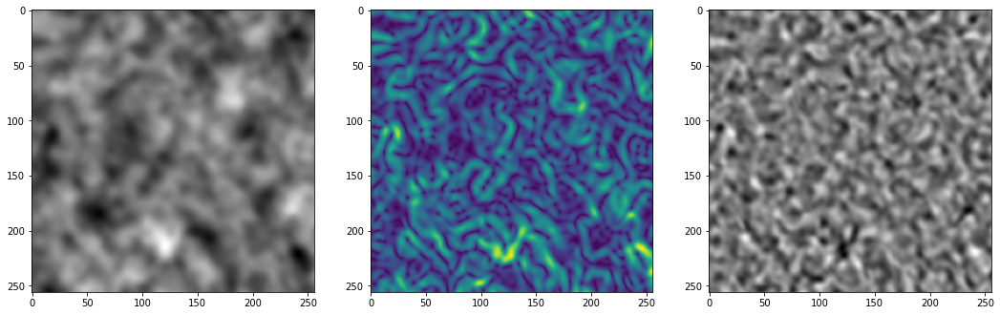

Step 100, Total loss 0.412435, iteration time 0.217818, PSNR: 4.768299


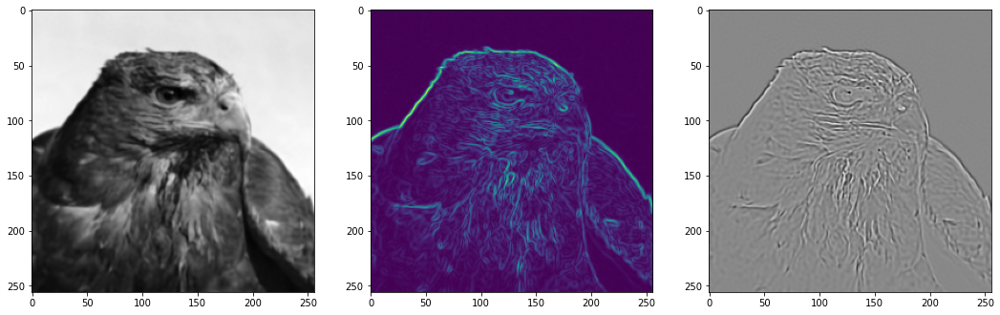

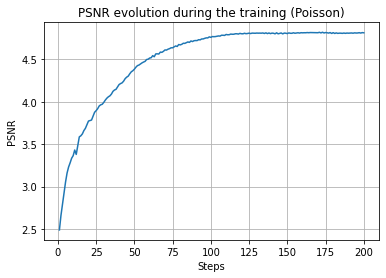

In [18]:
# Image Recontruction
cameraman_poisson = Div2K_Poisson_Equation(256)
dataloader = DataLoader(cameraman_poisson, batch_size=1, pin_memory=True, num_workers=0)

poisson_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                      hidden_layers=3, outermost_linear=True)
poisson_siren.cuda()
gc.collect()
total_steps = 200
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=poisson_siren.parameters())

model_input, gt = next(iter(dataloader))
gt = {key: value.cuda() for key, value in gt.items()}
model_input = model_input.cuda()
psnr_poisson =  []
for step in range(total_steps):
    start_time = time.time()

    model_output, coords = poisson_siren(model_input)
    train_loss = gradients_mse(model_output, coords, gt['grads'])
    psnr = psnr_fn(model_output,gt['pixels'])
    psnr_poisson.append(psnr)
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, iteration time %0.6f, PSNR: %0.6f" % (step, train_loss, time.time() - start_time,psnr))

        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
        axes[1].imshow(img_grad.cpu().norm(dim=-1).view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(),cmap='gray')
        plt.show()
        
    optim.zero_grad()
    train_loss.backward()
    optim.step()

fig, ax = plt.subplots()
t = range(1,total_steps+1)
ax.plot(t, psnr_poisson)
ax.set(xlabel='Steps', ylabel='PSNR',
       title='PSNR evolution during the training (Poisson)')
ax.grid()
#fig.savefig("psnr_relu_image_fitting.png")
plt.show()

Step 0, Total loss 1.530077, iteration time 0.002675


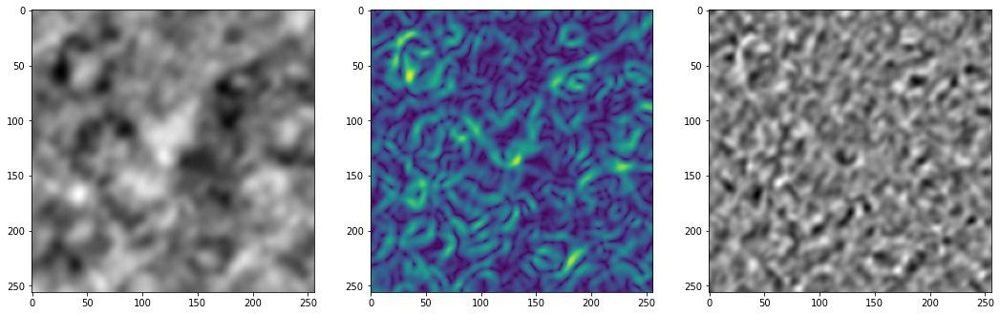

Step 100, Total loss 0.165236, iteration time 0.085066


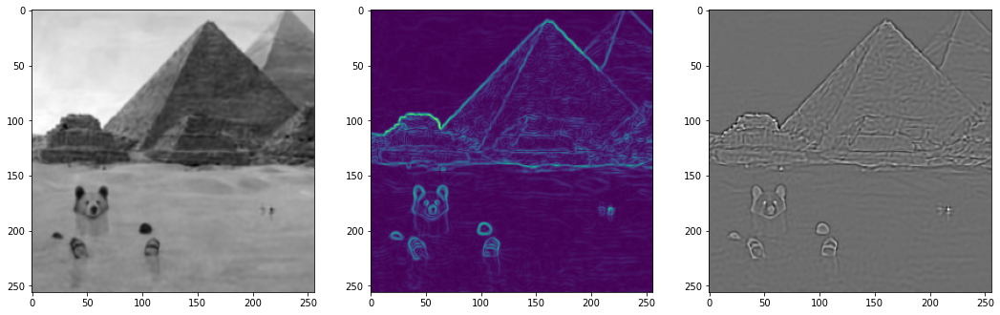

Step 200, Total loss 0.052554, iteration time 0.081954


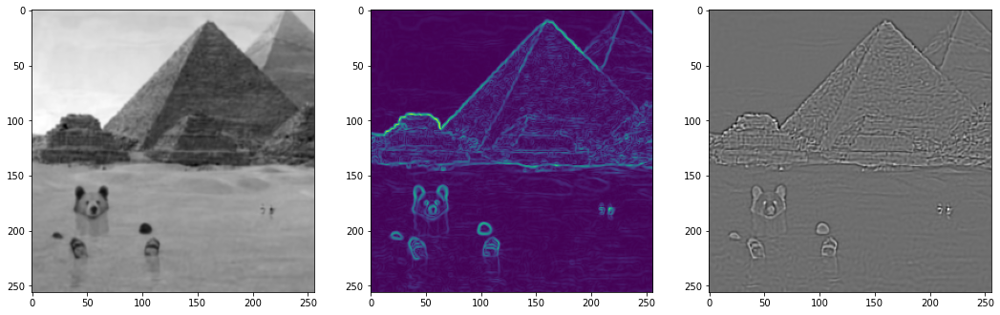

Step 300, Total loss 0.028334, iteration time 0.083144


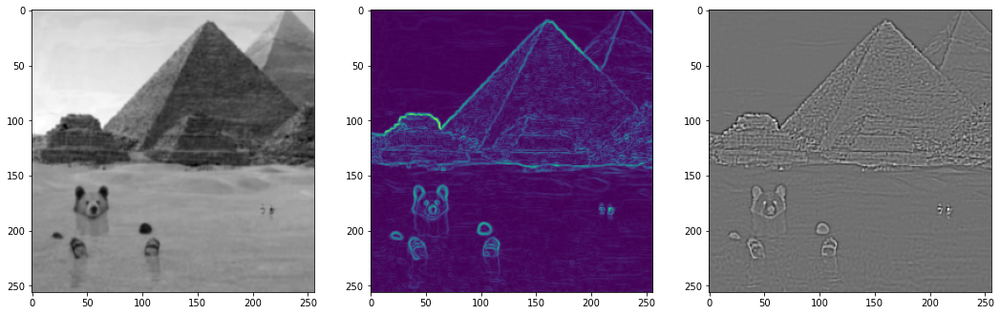

Step 400, Total loss 0.019093, iteration time 0.083387


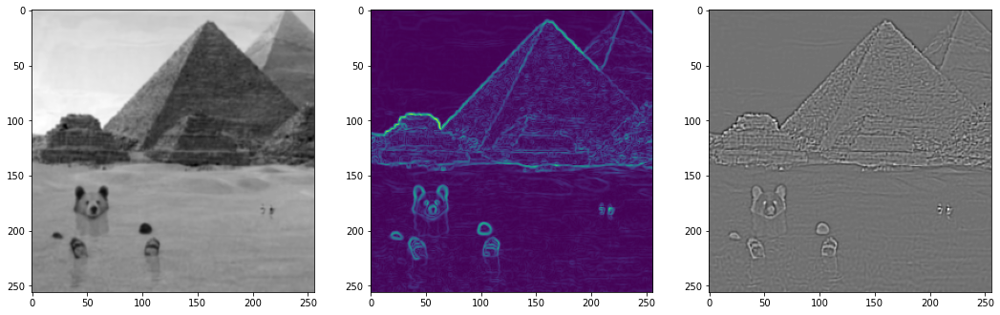

Step 500, Total loss 0.033241, iteration time 0.084476


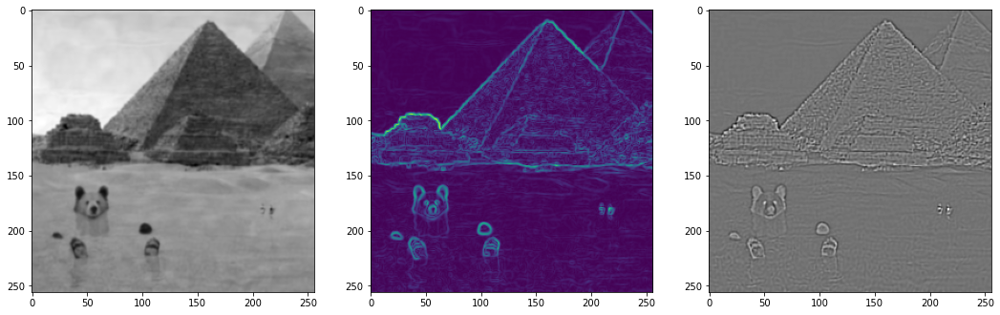

Step 600, Total loss 0.035321, iteration time 0.082760


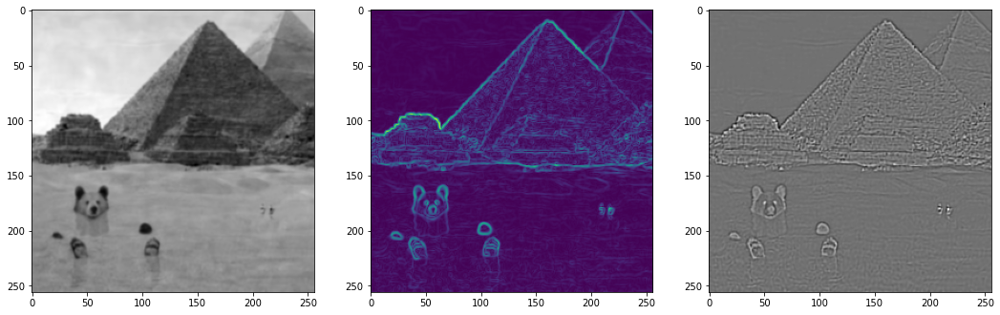

Step 700, Total loss 0.015041, iteration time 0.084409


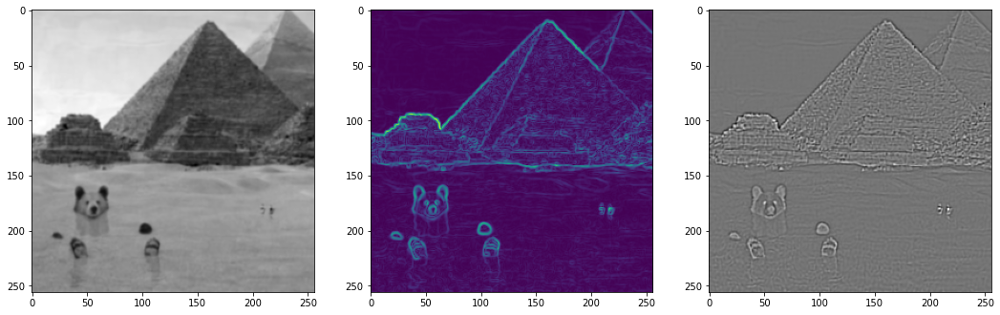

Step 800, Total loss 0.034531, iteration time 0.083217


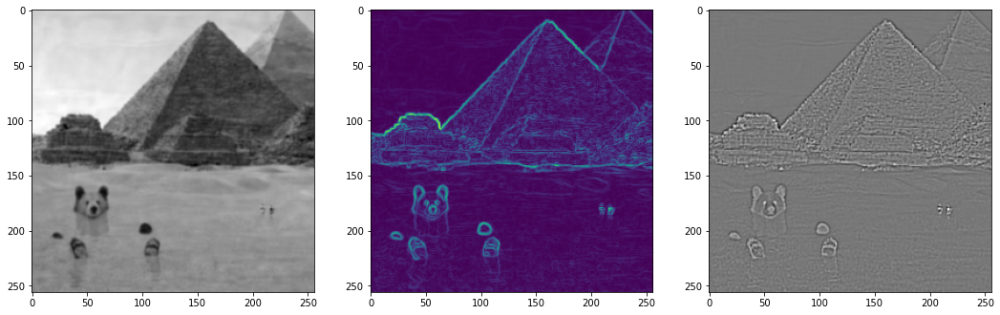

Step 900, Total loss 0.005937, iteration time 0.084848


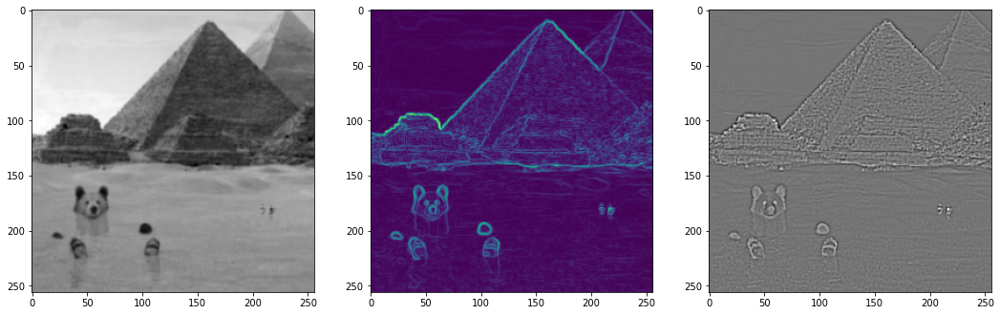

Text(0.5, 1.0, 'Image combining on the basis of the gradients (SIREN)')

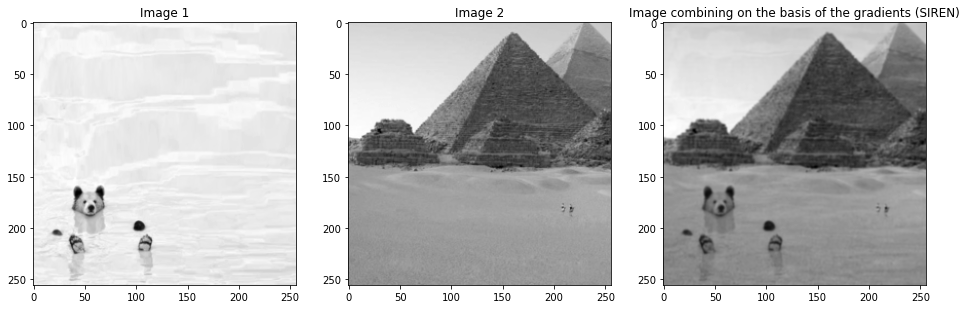

In [20]:
# Image Combining
IMAGE_SIZE = 256
cameraman_poisson = PoissonEqn_fromFile('bear_edited.jpg',IMAGE_SIZE)
astronaut_poisson = PoissonEqn_fromFile('cairo_edited.jpg',IMAGE_SIZE)
dataloader_cameraman = DataLoader(cameraman_poisson, batch_size=1, pin_memory=False, num_workers=0)
dataloader_astronaut = DataLoader(astronaut_poisson, batch_size=1, pin_memory=False, num_workers=0)
poisson_siren = Siren(in_features=2, out_features=1, hidden_features=IMAGE_SIZE, 
                      hidden_layers=3, outermost_linear=True)
poisson_siren.cuda()
model_input, gt_cameraman = next(iter(dataloader_cameraman))
model_input, gt_astronaut = next(iter(dataloader_astronaut))
gt = {}
alfa = 0.3
gt['grads'] = alfa * gt_cameraman['grads'] + (1-alfa) * gt_astronaut['grads']
gt['pixels'] = alfa * gt_cameraman['pixels'] + (1-alfa) * gt_astronaut['pixels']
gt['laplace'] = alfa * gt_cameraman['laplace'] + (1-alfa) * gt_astronaut['laplace']

gt = {key: value.cuda() for key, value in gt.items()}
model_input = model_input.cuda()
gc.collect()

total_steps = 1000
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=poisson_siren.parameters())



for step in range(total_steps):
    start_time = time.time()

    model_output, coords = poisson_siren(model_input)
    train_loss = gradients_mse(model_output, coords, gt['grads'])

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, iteration time %0.6f" % (step, train_loss, time.time() - start_time))

        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
        axes[1].imshow(img_grad.cpu().norm(dim=-1).view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(),cmap='gray')
        plt.show()
        
    optim.zero_grad()
    train_loss.backward()
    optim.step()


fig, axes = plt.subplots(1, 3, figsize=(16, 6))
axes[0].imshow(gt_cameraman['pixels'].cpu().view(256,256).detach().numpy(),cmap='gray')
axes[0].set_title('Image 1')
axes[1].imshow(gt_astronaut['pixels'].cpu().view(256,256).detach().numpy(),cmap='gray')
axes[1].set_title('Image 2')
axes[2].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
axes[2].set_title('Image combining on the basis of the gradients (SIREN)')

### Super Resolution Baseline

Iteration 1


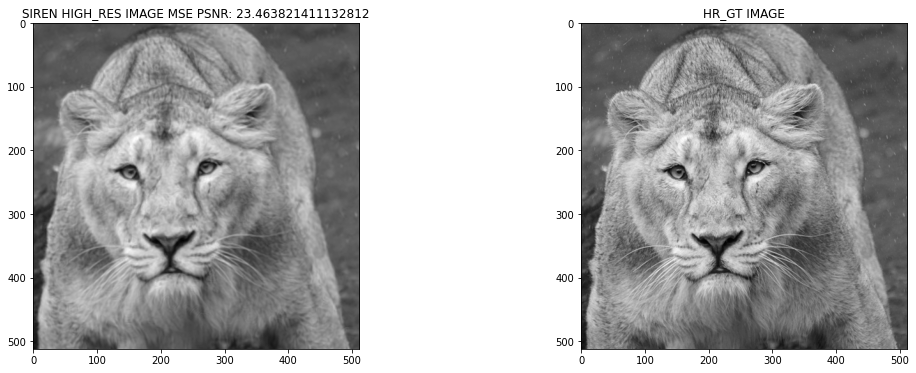

Iteration 2


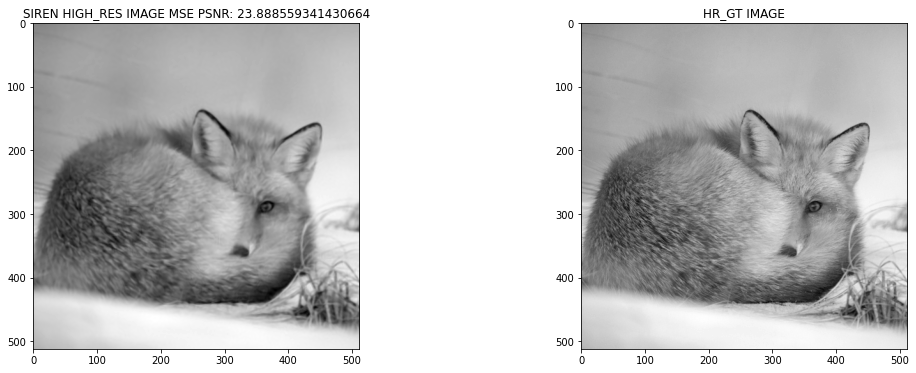

Iteration 3


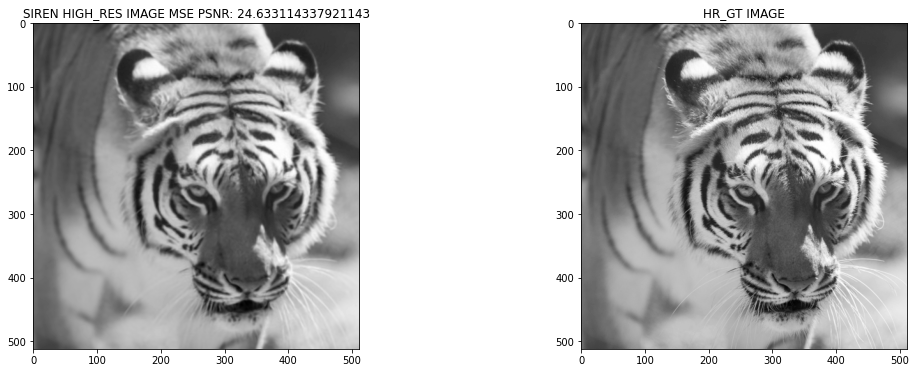

Iteration 4


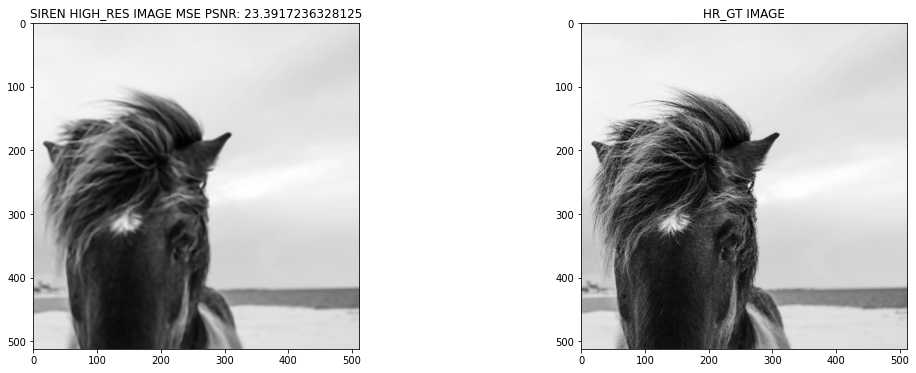

Iteration 5


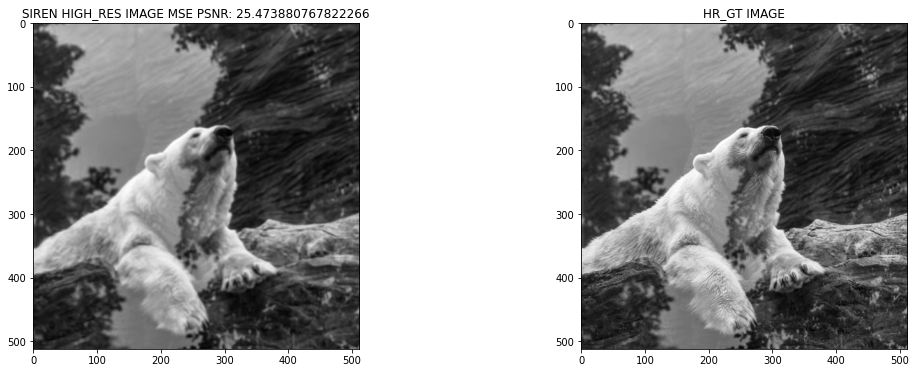

{'MSE': 24.170219898223877}


In [22]:
IMAGE_SIZE = 256
magnification = 2
IMAGE_SIZE_HR = IMAGE_SIZE*magnification
loss_fn_list = {'MSE':image_mse,
                #'MSE-FH': image_mse_FH_prior,
                #'MSE-TV':image_mse_TV_prior
                }
psnr_dict_SR = {}
dict_SR = {}
for key,ls in loss_fn_list.items():
  div2k = Div2K_images(IMAGE_SIZE,'validation')
  div2k_HR = Div2K_images(IMAGE_SIZE_HR,'validation')
  dataloader = iter(DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0))
  dataloader_HR = iter(DataLoader(div2k_HR, batch_size=1, pin_memory=False, num_workers=0))
  psnr_list = []
  if (key == 'MSE-FH'):
      MAX_ITERATION = 1000
      lambda_reg = 1e-6
  else:
      MAX_ITERATION = 1000
      lambda_reg = 1e-4
  for i in range(5):
    print('Iteration %d'%(i+1))
    model_input, ground_truth = next(dataloader)
    model_input_HR, ground_truth_HR = next(dataloader_HR)
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    model_input_HR, ground_truth_HR= model_input_HR.cuda(), ground_truth_HR.cuda()
    img_siren = train_siren(model_input,ground_truth,learning_rate=1e-4,max_iteration=MAX_ITERATION,loss_fn=ls,lambda_reg=lambda_reg)
    model_output_HR,coords = img_siren(model_input_HR)
    psnr = psnr_fn(model_output_HR,ground_truth_HR)
    psnr_list.append(psnr)
    fig, axes = plt.subplots(1,2, figsize=(18,6))
    axes[0].imshow(model_output_HR.cpu().view(IMAGE_SIZE_HR,IMAGE_SIZE_HR).detach().numpy(),cmap='gray')
    dict_SR[key] = model_output_HR.cpu().view(IMAGE_SIZE_HR,IMAGE_SIZE_HR).detach().numpy()
    axes[0].set_title('SIREN HIGH_RES IMAGE ' + key + ' PSNR: ' + str(psnr))
    axes[1].imshow(ground_truth_HR.cpu().view(IMAGE_SIZE_HR,IMAGE_SIZE_HR).detach().numpy(),cmap='gray')
    axes[1].set_title('HR_GT IMAGE')
    plt.show()
  psnr_dict_SR[key]=np.mean(psnr_list)
print(psnr_dict_SR)

# Ablation Studies

### Different Initialization
#### Setting the weights from a normal distribution, if they are too great, the frequencies are too high, noise in the derivatives

In [ ]:
##Sidelength = 512 not supported: will saturate memory
cameraman = Div2K_images(256,'validation')
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=False, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=2, outermost_linear=True,ablation_studies=True)
img_siren.cuda()

##Garbage collector: to avoid saturate CUDA memory...
gc.collect()

total_steps = 1001 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(),cmap='gray')
        plt.show()
    optim.zero_grad()
    loss.backward()
    optim.step()

### Changing c_uniform and w0

In [ ]:
##Sidelength = 512 not supported: will saturate memory
cameraman = Div2K_images(256,'validation')
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=False, num_workers=0)
psnr_dict = {}
for c in [6,10,12,20]:
  img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                    hidden_layers=2, outermost_linear=True,ablation_studies=False,first_omega_0 = 30,hidden_omega_0=60,c_uniform=c)
  img_siren.cuda()

  ##Garbage collector: to avoid saturate CUDA memory...
  gc.collect()

  total_steps = 801 # Since the whole image is our dataset, this just means 500 gradient descent steps.
  steps_til_summary = 100

  optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

  model_input, ground_truth = next(iter(dataloader))
  model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
  psnr_list = []
  for step in range(total_steps):
      model_output, coords = img_siren(model_input)
      loss = ((model_output - ground_truth)**2).mean()
      psnr = psnr_fn(model_output,ground_truth)
      psnr_list.append(psnr)
      if not step % steps_til_summary:
          print("Step %d, Total loss %0.6f" % (step, loss))
          img_grad = gradient(model_output, coords)
          img_laplacian = laplace(model_output, coords)
          fig, axes = plt.subplots(1,3, figsize=(18,6))
          axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
          axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
          axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(),cmap='gray')
          plt.show()
      optim.zero_grad()
      loss.backward()
      optim.step()
  psnr_dict[c] = psnr_list

t = range(0,801)
plt.figure(1)
fig, ax = plt.subplots()
ax.set(xlabel='Steps', ylabel='PSNR',
        title='PSNR evolution during training')
for c in [6,10,12,20]:
  ax.plot(t, psnr_dict[c],label= 'c = '+ str(c))
ax.legend()
ax.grid()
name = 'different_c_w0_10_ablation_psnr.png'
fig.savefig(name)

### Changin Omega_0

In [ ]:
##Sidelength = 512 not supported: will saturate memory
cameraman = ImageAstronaut(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=False, num_workers=0)
img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=2, outermost_linear=True,ablation_studies=False,first_omega_0 = 40,hidden_omega_0=120)
img_siren.cuda()
##Garbage collector: to avoid saturate CUDA memory...
gc.collect()

total_steps = 1001 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy(),cmap='gray')
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(),cmap='gray')
        plt.show()
    optim.zero_grad()
    loss.backward()
    optim.step()

# Super Resolution: Variation

## Bicubic Loss

In [ ]:
IMAGE_SIZE = 256
magnification = 2
IMAGE_SIZE_HR = IMAGE_SIZE*magnification
loss_fn_list = {'BCL':super_res_loss_image_mse,
                #'BCL-FH': super_res_loss_FH_prior,
                'BCL-TV':super_res_loss_TV_prior
                }
psnr_dict_SR_BCB = {}
for key,ls in loss_fn_list.items():
  div2k = Div2K_images(IMAGE_SIZE)
  div2k_HR = Div2K_images(IMAGE_SIZE_HR)
  dataloader = iter(DataLoader(div2k, batch_size=1, pin_memory=False, num_workers=0))
  dataloader_HR = iter(DataLoader(div2k_HR, batch_size=1, pin_memory=False, num_workers=0))
  psnr_list = []
  if (key == 'BCL-FH'):
      MAX_ITERATION = 1000
      lambda_reg = 1e-6
  else:
      MAX_ITERATION = 1000
      lambda_reg = 1e-4
  for i in range(5):
    print('Iteration %d'%(i+1))
    model_input, ground_truth = next(dataloader)
    model_input_HR, ground_truth_HR = next(dataloader_HR)
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    model_input_HR, ground_truth_HR= model_input_HR.cuda(), ground_truth_HR.cuda()
    img_siren = train_siren(learning_rate=1e-4,max_iteration=MAX_ITERATION,
                               lambda_reg=lambda_reg,
                               X=model_input_HR,y=ground_truth,
                               loss_fn=ls)
    model_output_HR,coords = img_siren(model_input_HR)
    psnr = psnr_fn(model_output_HR,ground_truth_HR)
    psnr_list.append(psnr)
    fig, axes = plt.subplots(1,2, figsize=(18,6))
    axes[0].imshow(model_output_HR.cpu().view(IMAGE_SIZE_HR,IMAGE_SIZE_HR).detach().numpy(),cmap='gray')
    axes[0].set_title('SIREN HIGH_RES IMAGE ' + key + ' PSNR: ' + str(psnr))
    axes[1].imshow(ground_truth_HR.cpu().view(IMAGE_SIZE_HR,IMAGE_SIZE_HR).detach().numpy(),cmap='gray')
    axes[1].set_title('HR_GT IMAGE')
    plt.show()
  psnr_dict_SR_BCB[key]=np.mean(psnr_list)
print(psnr_dict_SR_BCB)

## A Meta Learning approach

In [ ]:
MAX_OUTER_STEP = 20
MAX_INNER_STEP = 201
OUTER_LR = 1e-4
INNER_LR = 1e-4
SHOW_PLOT = True
STEPS_TIL_SUMMARY = 200
IMAGE_SIZE = 256
LAMBDA_REG = 1e-6
BATCH_SIZE = [1,3,5,7]
LOAD = 1

In [ ]:
## MAML
print('Starting MAML')
torch.cuda.empty_cache()
if not LOAD:
  for i in BATCH_SIZE:
    print('Meta with batch ' + str(i))
    param = meta_learning_siren(MAX_OUTER_STEP,MAX_INNER_STEP,OUTER_LR,INNER_LR,show_plot=SHOW_PLOT,steps_til_summary=STEPS_TIL_SUMMARY,image_size=IMAGE_SIZE,inner_loss_fn=image_mse,outer_loss_fn=image_mse,batch_size=i)
    name = './parameters_'+str(i)
    torch.save(param, name)

In [ ]:
## CUSTOM BATCH 1
print('Starting Our META')
torch.cuda.empty_cache()
if not LOAD:
  param = meta_learning_siren_batch_1(MAX_OUTER_STEP,MAX_INNER_STEP,OUTER_LR,INNER_LR,show_plot=SHOW_PLOT,steps_til_summary=STEPS_TIL_SUMMARY,image_size=IMAGE_SIZE,inner_loss_fn=image_mse,outer_loss_fn=image_mse)
  name = './parameters_custom'
  torch.save(param, name)

In [ ]:
## REPTILE
print('Starting Reptile Learning')
param = meta_learning_siren_REPTILE(MAX_OUTER_STEP,MAX_INNER_STEP,OUTER_LR,INNER_LR,show_plot=SHOW_PLOT,steps_til_summary=STEPS_TIL_SUMMARY,image_size=IMAGE_SIZE)
torch.save(param, './parameters_reptile_1')

In [ ]:
## Validation
torch.cuda.empty_cache()
psnr_dict = {}
param_dict = {
    'base_model':None,
    'maml batch 1':'parameters_1',
    'maml batch 3':'parameters_3',
    'maml batch 5':'parameters_5',
    'maml batch 7':'parameters_7',
    'custom bacth 1':'parameters_custom',
    'reptile batch 1':'parameters_reptile_1'
}
for key,param_name in param_dict.items():
  if param_name == None:
    param = None
  else: 
    param = torch.load('./'+param_name)
  MAX_INNER_STEP = 800
  torch.cuda.empty_cache()
  print(key)
  psnr_list = validate_single_model(param,MAX_INNER_STEP,INNER_LR)
  psnr_dict[key] = psnr_list

t = range(1,MAX_INNER_STEP+1)
plt.figure(1)
fig, ax = plt.subplots(figsize=(9,5))
ax.set(xlabel='Steps', ylabel='PSNR',
        title='PSNR evolution during training')
for key,psnr_list in psnr_dict.items():
  ax.plot(t, psnr_list,label=key)
name = 'psnr_meta_fitting_validation_1.png'
ax.legend()
ax.grid()
fig.savefig(name)

In [ ]:
## Super Res Model Comparison
torch.cuda.empty_cache()
try:
  with open('psnr_dict.json', 'r') as fp:
    psnr_dict = json.load(fp)
except:
  psnr_dict = {}

param_dict = {
    #'maml batch 1':'parameters_1',
    #'maml batch 3':'parameters_3',
    #'maml batch 5':'parameters_5',
    #'maml batch 7':'parameters_7',
    #'custom bacth 1':'parameters_custom',
    #'reptile batch 1':'parameters_reptile_1',
    #'maml batch 1 MSE-TV':'parameters_1',
    #'maml batch 3 MSE-TV':'parameters_3',
    #'maml batch 5 MSE-TV':'parameters_5',
    #'maml batch 7 MSE-TV':'parameters_7',
    #'custom bacth 1 MSE-TV':'parameters_custom',
    #'reptile batch 1 MSE-TV':'parameters_reptile_1',
    #'maml batch 1 MSE-FH':'parameters_1',
    #'maml batch 3 MSE-FH':'parameters_3',
    #'maml batch 5 MSE-FH':'parameters_5',
    #'maml batch 7 MSE-FH':'parameters_7',
    #'custom bacth 1 MSE-FH':'parameters_custom',
    'reptile batch 1 MSE-FH':'parameters_reptile_1',
    'maml batch 1 BCL':'parameters_1',
    'maml batch 3 BCL':'parameters_3',
    'maml batch 5 BCL':'parameters_5',
    'maml batch 7 BCL':'parameters_7',
    'custom bacth 1 BCL':'parameters_custom',
    'reptile batch 1 BCL':'parameters_reptile_1',
    'maml batch 1 BCL-TV':'parameters_1',
    'maml batch 3 BCL-TV':'parameters_3',
    'maml batch 5 BCL-TV':'parameters_5',
    'maml batch 7 BCL-TV':'parameters_7',
    'custom bacth 1 BCL-TV':'parameters_custom',
    'reptile batch 1 BCL-TV':'parameters_reptile_1',

}
for key,param_name in param_dict.items():
  param = torch.load('./'+param_name)
  MAX_INNER_STEP = 800
  torch.cuda.empty_cache()
  print(key)
  if 'BCL-TV' in key:
    ls = super_res_loss_TV_prior
  elif 'MSE-TV' in key:
    ls = image_mse_TV_prior
  elif 'MSE-FH' in key:
    ls = image_mse_FH_prior
  else:
    ls = image_mse
  mean_psnr = super_res_single_validation(param0=param,max_inner_step=MAX_INNER_STEP,inner_lr=INNER_LR,inner_loss_fn=ls)
  psnr_dict[key] = mean_psnr
  with open('psnr_dict.json', 'w') as fp:
    json.dump(psnr_dict, fp)

In [ ]:
## Some visual comparison
MAX_INNER_STEP = 300
param = torch.load('./parameters_reptile_1')
super_res_validation_bicubic_mse(param,MAX_INNER_STEP,INNER_LR,inner_loss_fn=super_res_loss_image_mse)